<a href="https://colab.research.google.com/github/Allekarthik/AIML_Projects_and_labs/blob/main/Brain_tumor_detection_using_yolov8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import kagglehub
pkdarabi_medical_image_dataset_brain_tumor_detection_path = kagglehub.dataset_download('pkdarabi/medical-image-dataset-brain-tumor-detection')

print('Data source import complete.')


100%|██████████| 297M/297M [00:02<00:00, 138MB/s]

Extracting files...


Data source import complete.


In [ ]:

!pip install ultralytics
from IPython import display
display.clear_output()

In [ ]:

import os
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:

T_Model = YOLO('yolov8n.pt')

In [ ]:
%%bash
mkdir -p /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8
cat > /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8/data.yaml << EOL
path: /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8
train: train/images
val: valid/images
test: test/images
names:
  0: no_tumor
  1: tumor
EOL

In [ ]:
import os

download_path = '/root/.cache/kagglehub/pkdarabi/medical-image-dataset-brain-tumor-detection'
print(os.listdir(download_path))

['BrainTumorYolov8']


In [ ]:
import os

dataset_base_path = '/root/.cache/kagglehub/pkdarabi/medical-image-dataset-brain-tumor-detection/BrainTumorYolov8'
print(os.listdir(dataset_base_path))

['data.yaml']


In [ ]:
import os

download_path = '/root/.cache/kagglehub/pkdarabi/medical-image-dataset-brain-tumor-detection'

for root, dirs, files in os.walk(download_path):
    if 'train' in dirs and 'valid' in dirs and 'test' in dirs:
        print(f"Found dataset directories in: {root}")
        break
else:
    print("Dataset directories not found.")

Dataset directories not found.


In [ ]:
import os

found_path = None
for root, dirs, files in os.walk('/'):
    if 'train' in dirs and 'valid' in dirs and 'test' in dirs:
        # Check if these directories contain 'images' and 'labels' subdirectories
        if all(os.path.exists(os.path.join(root, d, 'images')) and os.path.exists(os.path.join(root, d, 'labels')) for d in ['train', 'valid', 'test']):
            found_path = root
            break

if found_path:
    print(f"Found dataset directories in: {found_path}")
else:
    print("Dataset directories not found.")

Found dataset directories in: /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8


In [ ]:
best_model_path = 'runs/detect/train5/weights/best.pt' # Update the path if your run name is different
best_model = YOLO(best_model_path)

metrics = best_model.val(split='test')

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 8.3±4.1 MB/s, size: 31.1 KB)


val: Scanning /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8/test/labels... 308 images, 0 backgrounds, 87 corrupt: 100%|██████████| 308/308 [00:00<00:00, 776.85it/s]

val: /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8/test/images/1003_jpg.rf.028d6d76fba92dd9e5dc59dc9d0f7293.jpg: ignoring corrupt image/label: Label class 2 exceeds dataset class count 2. Possible class labels are 0-1
val: /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8/test/images/1012_jpg.rf.a9d8d27f5e1d382e0b93ff4a479f4519.jpg: ignoring corrupt image/label: Label class 2 exceeds dataset class count 2. Possible class labels are 0-1
val: /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8/test/images/1018_jpg.rf.29ed2fb6754ca58ae27204ef24344650.jpg: ignoring corrupt image/label: Label class 2 exceeds dataset class count 2. Possible class labels are 0-1
val: /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/

val: New cache created: /root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.19it/s]


                   all        221        221      0.862      0.797      0.884       0.67
              no_tumor        159        159      0.806      0.642      0.785      0.509
                 tumor         62         62      0.917      0.952      0.983      0.831
Speed: 1.8ms preprocess, 5.0ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/val



0: 640x640 1 no_tumor, 20.0ms
Speed: 2.8ms preprocess, 20.0ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 18.7ms
Speed: 2.4ms preprocess, 18.7ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 30.9ms
Speed: 2.5ms preprocess, 30.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 30.2ms
Speed: 12.0ms preprocess, 30.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 no_tumors, 15.5ms
Speed: 2.5ms preprocess, 15.5ms inference, 5.1ms postprocess per image at 

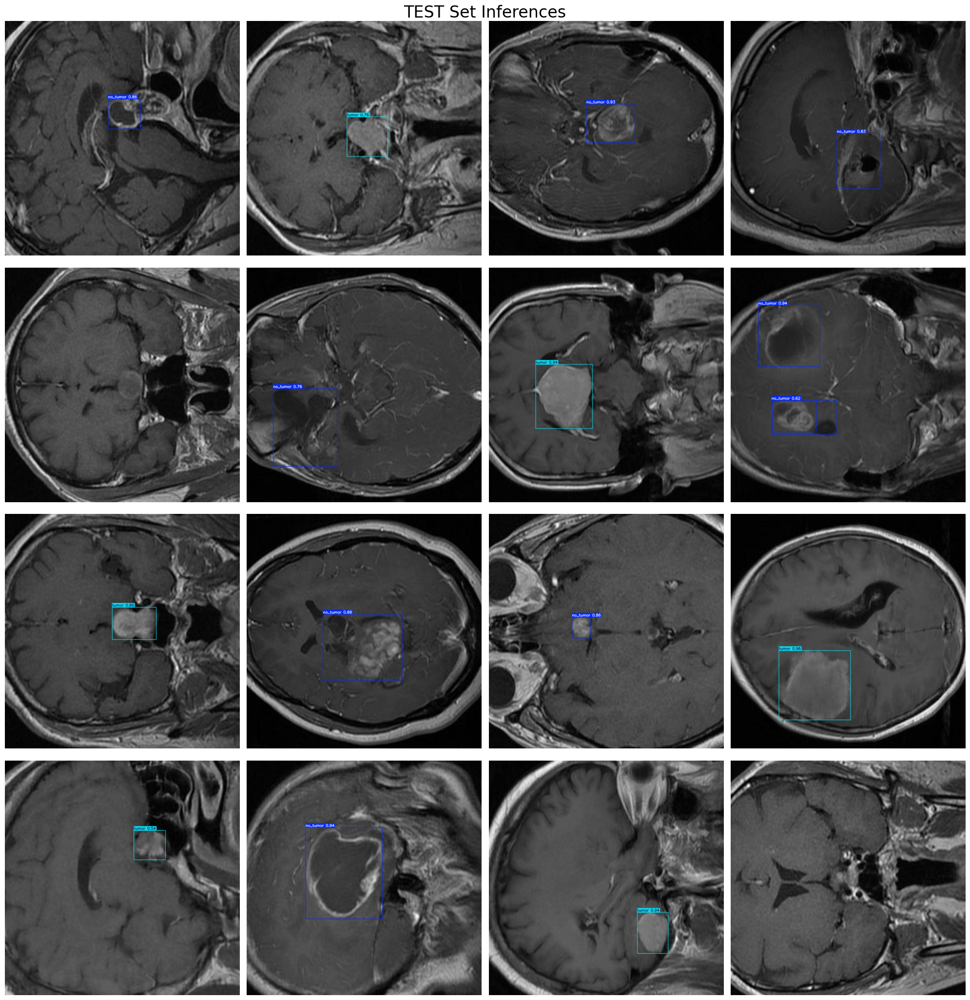

In [ ]:
def normalize_image(image):
    return image / 255.0


def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)


dataset_path = '/root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')


image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]


if len(image_files) > 0:

    num_images = len(image_files)
    step_size = max(1, num_images // 16)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]


    fig, axes = plt.subplots(4, 4, figsize=(20, 21))
    fig.suptitle('TEST Set Inferences', fontsize=24)

    axes = axes.flatten()
    for i, ax in enumerate(axes):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            image = cv2.imread(image_path)


            if image is not None:

                resized_image = resize_image(image, size=(640, 640))

                normalized_image = normalize_image(resized_image)

                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)


                results = best_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)


                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')


    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
print(metrics.results_dict.keys())

dict_keys(['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'fitness'])


In [ ]:
print("Overall Metrics:")
print(f"mAP50: {metrics.results_dict['metrics/mAP50(B)']:.3f}")
print(f"mAP50-95: {metrics.results_dict['metrics/mAP50-95(B)']:.3f}")
print(f"Precision: {metrics.results_dict['metrics/precision(B)']:.3f}")
print(f"Recall: {metrics.results_dict['metrics/recall(B)']:.3f}")

# The metrics per class are not directly available as separate keys in the results_dict based on the output of the previous command.
# I will only provide the overall metrics and their interpretation.

print("\nInterpretation:")
print("mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.")
print("mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.")
print("Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.")
print("Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).")

Overall Metrics:
mAP50: 0.884
mAP50-95: 0.670
Precision: 0.862
Recall: 0.797

Interpretation:
mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.
mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.
Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.
Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).


Displaying graphs from runs/detect/train5:

Displaying: results.png


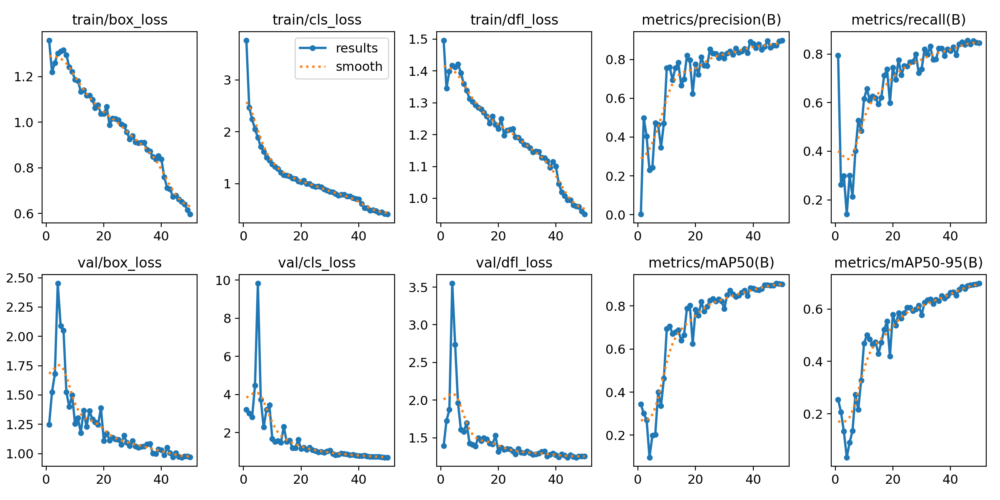


Displaying: confusion_matrix.png


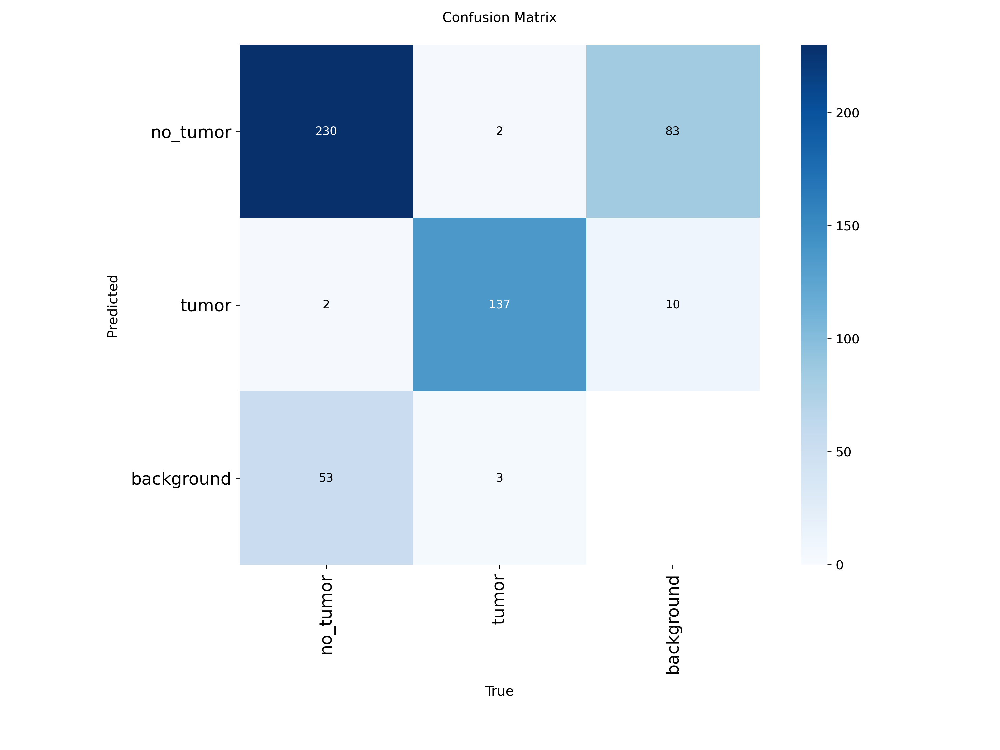


Displaying: confusion_matrix_normalized.png


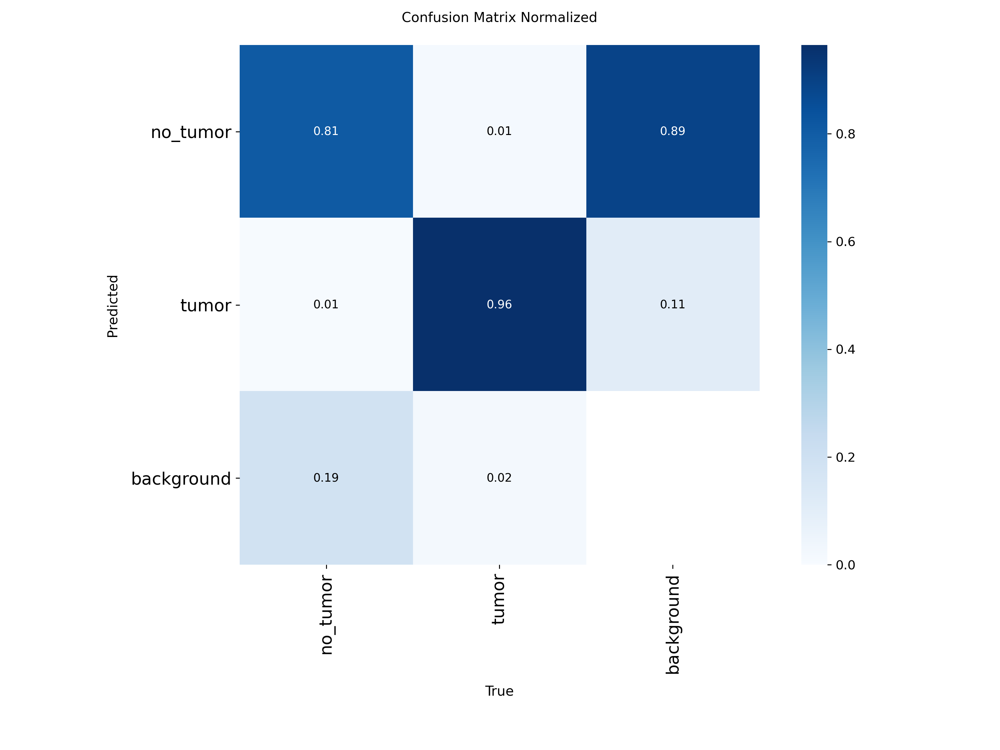


Graph not found: F1_curve.png

Graph not found: P_curve.png

Graph not found: R_curve.png


In [ ]:
from IPython.display import Image, display
import os

run_dir = 'runs/detect/train5' # Update this if your run directory name is different

# List of common graph filenames
graph_files = ['results.png', 'confusion_matrix.png', 'confusion_matrix_normalized.png', 'F1_curve.png', 'P_curve.png', 'R_curve.png']

print(f"Displaying graphs from {run_dir}:")

for graph_file in graph_files:
    graph_path = os.path.join(run_dir, graph_file)
    if os.path.exists(graph_path):
        print(f"\nDisplaying: {graph_file}")
        display(Image(filename=graph_path))
    else:
        print(f"\nGraph not found: {graph_file}")


0: 640x640 1 no_tumor, 40.7ms
Speed: 4.2ms preprocess, 40.7ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 21.3ms
Speed: 3.8ms preprocess, 21.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 9.8ms
Speed: 3.2ms preprocess, 9.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 25.2ms
Speed: 20.2ms preprocess, 25.2ms inference, 7.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 no_tumors, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 2.5ms postprocess per image at 

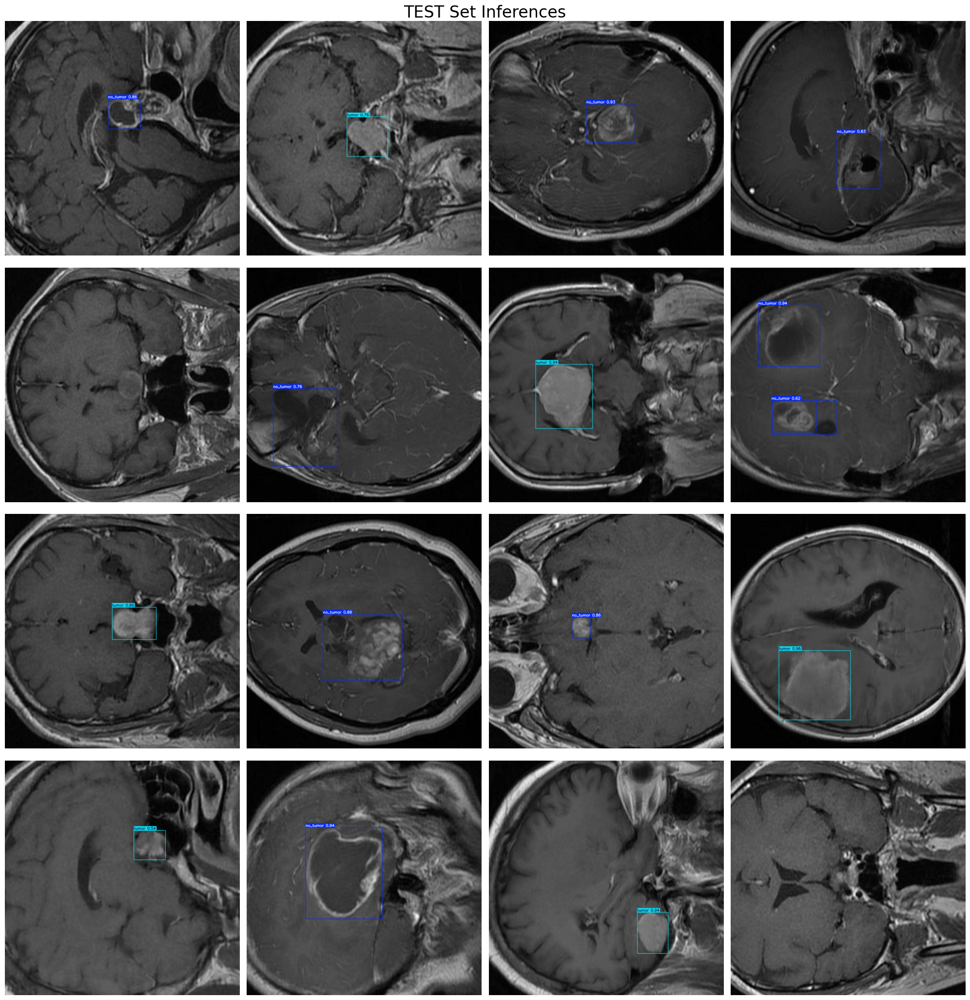

In [ ]:
def normalize_image(image):
    return image / 255.0


def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)


dataset_path = '/root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')


image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]


if len(image_files) > 0:

    num_images = len(image_files)
    step_size = max(1, num_images // 16)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]


    fig, axes = plt.subplots(4, 4, figsize=(20, 21))
    fig.suptitle('TEST Set Inferences', fontsize=24)

    axes = axes.flatten()
    for i, ax in enumerate(axes):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            image = cv2.imread(image_path)


            if image is not None:

                resized_image = resize_image(image, size=(640, 640))

                normalized_image = normalize_image(resized_image)

                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)


                results = best_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)


                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')


    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
print("Overall Metrics:")
print(f"mAP50: {metrics.results_dict['metrics/mAP50(B)']:.3f}")
print(f"mAP50-95: {metrics.results_dict['metrics/mAP50-95(B)']:.3f}")
print(f"Precision: {metrics.results_dict['metrics/precision(B)']:.3f}")
print(f"Recall: {metrics.results_dict['metrics/recall(B)']:.3f}")

print("\nInterpretation:")
print("mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.")
print("mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.")
print("Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.")
print("Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).")

# Explain why per-class metrics are not provided based on the available keys
print("\nNote:")
print("Based on the keys available in the 'metrics.results_dict', per-class metrics are not directly provided as separate key-value pairs in this dictionary structure.")

Overall Metrics:
mAP50: 0.884
mAP50-95: 0.670
Precision: 0.862
Recall: 0.797

Interpretation:
mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.
mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.
Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.
Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).

Note:
Based on the keys available in the 'metrics.results_dict', per-class metrics are not directly provided as separate key-va

In [ ]:
print("Overall Metrics:")
print(f"mAP50: {metrics.results_dict['metrics/mAP50(B)']:.3f}")
print(f"mAP50-95: {metrics.results_dict['metrics/mAP50-95(B)']:.3f}")
print(f"Precision: {metrics.results_dict['metrics/precision(B)']:.3f}")
print(f"Recall: {metrics.results_dict['metrics/recall(B)']:.3f}")

print("\nInterpretation:")
print("mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.")
print("mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.")
print("Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.")
print("Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).")

Overall Metrics:
mAP50: 0.884
mAP50-95: 0.670
Precision: 0.862
Recall: 0.797

Interpretation:
mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.
mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.
Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.
Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).


# Task
Visualize test set inferences, explore metrics, and summarize the results and the performance of the trained model.

## Visualize test set inferences

### Subtask:
Display some images from the test set with bounding boxes predicted by the trained model to visually inspect the performance.


**Reasoning**:
The subtask is to visualize test set inferences. The provided instructions outline the steps to load test images, preprocess them, run inference using the trained model, and display the annotated images in a grid. I will combine these steps into a single code block.




0: 640x640 1 no_tumor, 20.6ms
Speed: 3.0ms preprocess, 20.6ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 no_tumor, 17.1ms
Speed: 2.4ms preprocess, 17.1ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 no_tumors, 7.4ms
Speed: 2.7ms preprocess, 7.4ms inference, 1.4ms postprocess per image at s

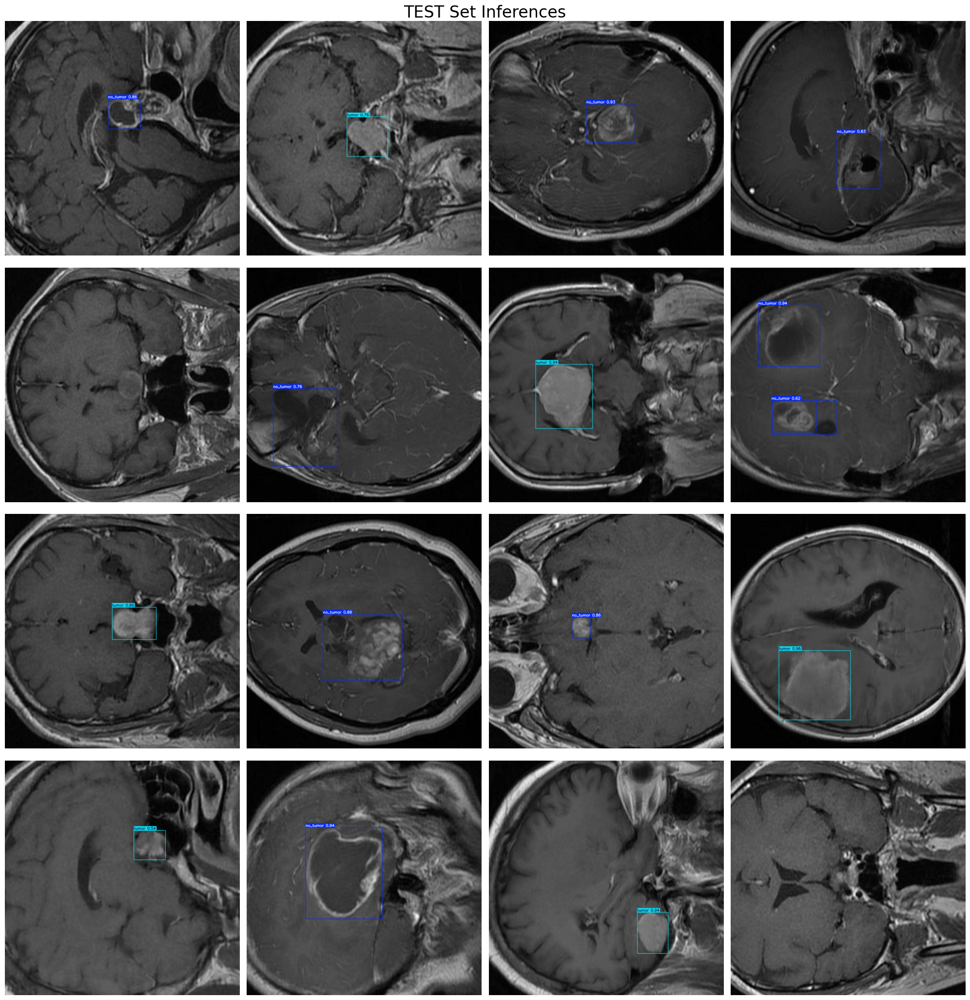

In [ ]:
def normalize_image(image):
    return image / 255.0


def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)


dataset_path = '/root/.cache/kagglehub/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection/versions/5/BrainTumor/BrainTumorYolov8'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')


image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]


if len(image_files) > 0:

    num_images = len(image_files)
    step_size = max(1, num_images // 16)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]


    fig, axes = plt.subplots(4, 4, figsize=(20, 21))
    fig.suptitle('TEST Set Inferences', fontsize=24)

    axes = axes.flatten()
    for i, ax in enumerate(axes):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            image = cv2.imread(image_path)


            if image is not None:

                resized_image = resize_image(image, size=(640, 640))

                normalized_image = normalize_image(resized_image)

                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)


                results = best_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)


                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')


    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


## Explore metrics

### Subtask:
Analyze the evaluation metrics obtained in the previous step to understand the model's performance in detail.


**Reasoning**:
Print and interpret the overall evaluation metrics from the `metrics.results_dict`.



In [ ]:
print("Overall Metrics:")
print(f"mAP50: {metrics.results_dict['metrics/mAP50(B)']:.3f}")
print(f"mAP50-95: {metrics.results_dict['metrics/mAP50-95(B)']:.3f}")
print(f"Precision: {metrics.results_dict['metrics/precision(B)']:.3f}")
print(f"Recall: {metrics.results_dict['metrics/recall(B)']:.3f}")

print("\nInterpretation:")
print("mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.")
print("mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.")
print("Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.")
print("Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).")

# Acknowledge that per-class metrics are not directly available.
print("\nNote:")
print("Based on the keys available in the 'metrics.results_dict', per-class metrics are not directly provided as separate key-value pairs in this dictionary structure.")

Overall Metrics:
mAP50: 0.884
mAP50-95: 0.670
Precision: 0.862
Recall: 0.797

Interpretation:
mAP50: Mean Average Precision at an IoU threshold of 0.5. A higher value indicates better overall detection performance with moderately overlapping bounding boxes.
mAP50-95: Mean Average Precision over a range of IoU thresholds from 0.5 to 0.95. This gives a more comprehensive measure of performance across various localization accuracies.
Precision: The ratio of correctly detected positive instances (true positives) to the total number of predicted positive instances (true positives + false positives). Higher precision means fewer false positives.
Recall: The ratio of correctly detected positive instances (true positives) to the total number of actual positive instances (true positives + false negatives). Higher recall means fewer false negatives (missed detections).

Note:
Based on the keys available in the 'metrics.results_dict', per-class metrics are not directly provided as separate key-va